In [ ]:
# step 1: load phenotyped adata
# step 2: loop through all knn values
# step 3: export geojsons for each knn value

In [2]:
import pandas as pd
import anndata as ad
from loguru import logger 
import time

import numpy as np
import tifffile

import matplotlib.pyplot as plt
import seaborn as sns

import shapely
import geopandas as gpd

import os
import sys
sys.path.append(os.path.abspath('../scripts'))
import utils
import importlib

from scipy.spatial import Voronoi, voronoi_plot_2d
import geopandas as gpd
from shapely.geometry import Polygon, MultiPolygon, box

import scimap as sm

Running SCIMAP  2.1.3


In [4]:
adata = ad.read_h5ad('../data/processed/20241003_1656_991_992_phenotyped.h5ad') 

In [5]:
adata

AnnData object with n_obs × n_vars = 1615233 × 8
    obs: 'CellID', 'Y_centroid', 'X_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Orientation', 'Extent', 'Solidity', 'filter_by_ann', 'mean_DAPI_bg_abs_above_value', 'mean_DAPI_bg_abs_below_value', 'Area_filter_nottoobig', 'Area_filter_nottoolow', 'Area_filter', 'DAPI_ratio', 'DAPI_ratio_pass_nottoolow', 'DAPI_ratio_pass_nottoohigh', 'DAPI_ratio_pass', 'imageid', 'phenotype'
    var: 'math', 'marker'

In [6]:
knn_list = [7,14,21,30,40,50]

for knn_number in knn_list:
    logger.info(f"Processing knn={knn_number}")
    start = time.time()

    adata = sm.tl.spatial_lda(adata, method='knn', knn=knn_number, label=f'spatial_lda_knn{knn_number}')
    adata = sm.tl.spatial_cluster(adata, df_name=f'spatial_lda_knn{knn_number}', method='kmeans', k=7, label=f'spatial_lda_knn{knn_number}_kmeans_k7')

    logger.info(f"Done in {time.time()-start} seconds")

2024-10-04 09:43:11.038 | INFO     | __main__:<module>:4 - Processing knn=7


Processing: ['991']
Identifying the 7 nearest neighbours for every cell
Processing: ['992']
Identifying the 7 nearest neighbours for every cell
Pre-Processing Spatial LDA
Training Spatial LDA
Calculating the Coherence Score

Coherence Score:  0.31785284356604804
Gathering the latent weights
Kmeans clustering


2024-10-04 09:45:41.396 | INFO     | __main__:<module>:10 - Done in 150.3566379547119 seconds
2024-10-04 09:45:41.396 | INFO     | __main__:<module>:4 - Processing knn=14


Processing: ['991']
Identifying the 14 nearest neighbours for every cell
Processing: ['992']
Identifying the 14 nearest neighbours for every cell
Pre-Processing Spatial LDA
Training Spatial LDA
Calculating the Coherence Score

Coherence Score:  0.34420324107822475
Gathering the latent weights
Kmeans clustering


2024-10-04 09:49:08.052 | INFO     | __main__:<module>:10 - Done in 206.65559101104736 seconds
2024-10-04 09:49:08.053 | INFO     | __main__:<module>:4 - Processing knn=21


Processing: ['991']
Identifying the 21 nearest neighbours for every cell
Processing: ['992']
Identifying the 21 nearest neighbours for every cell
Pre-Processing Spatial LDA
Training Spatial LDA
Calculating the Coherence Score

Coherence Score:  0.3516907772022454
Gathering the latent weights
Kmeans clustering


2024-10-04 09:53:16.918 | INFO     | __main__:<module>:10 - Done in 248.86437606811523 seconds
2024-10-04 09:53:16.919 | INFO     | __main__:<module>:4 - Processing knn=30


Processing: ['991']
Identifying the 30 nearest neighbours for every cell
Processing: ['992']
Identifying the 30 nearest neighbours for every cell
Pre-Processing Spatial LDA
Training Spatial LDA
Calculating the Coherence Score

Coherence Score:  0.35583355796432947
Gathering the latent weights
Kmeans clustering


2024-10-04 09:58:03.754 | INFO     | __main__:<module>:10 - Done in 286.8349609375 seconds
2024-10-04 09:58:03.755 | INFO     | __main__:<module>:4 - Processing knn=40


Processing: ['991']
Identifying the 40 nearest neighbours for every cell
Processing: ['992']
Identifying the 40 nearest neighbours for every cell
Pre-Processing Spatial LDA
Training Spatial LDA
Calculating the Coherence Score

Coherence Score:  0.3577975141441595
Gathering the latent weights
Kmeans clustering


2024-10-04 10:03:43.094 | INFO     | __main__:<module>:10 - Done in 339.3389081954956 seconds
2024-10-04 10:03:43.095 | INFO     | __main__:<module>:4 - Processing knn=50


Processing: ['991']
Identifying the 50 nearest neighbours for every cell
Processing: ['992']
Identifying the 50 nearest neighbours for every cell
Pre-Processing Spatial LDA
Training Spatial LDA
Calculating the Coherence Score

Coherence Score:  0.3593188273293075
Gathering the latent weights
Kmeans clustering


2024-10-04 10:10:19.017 | INFO     | __main__:<module>:10 - Done in 395.92124104499817 seconds


In [7]:
# subset the data by specific X and Y coordinates
# Define the range
x_min = 35000
x_max = 45000
y_min = 25000
y_max = 35000

# Subset the AnnData object based on the range in a column of adata.obs
subset_adata = adata[
    (adata.obs['X_centroid'] >= x_min) & 
    (adata.obs['X_centroid'] <= x_max) &
    (adata.obs['Y_centroid'] >= y_min) &
    (adata.obs['Y_centroid'] <= y_max)
    ]

In [ ]:
sm.pl.stacked_barplot(subset_adata, groupby='spatial_lda_knn7_kmeans_k7', color='spatial_lda_knn7_kmeans_k7', save='stacked_barplot.png')

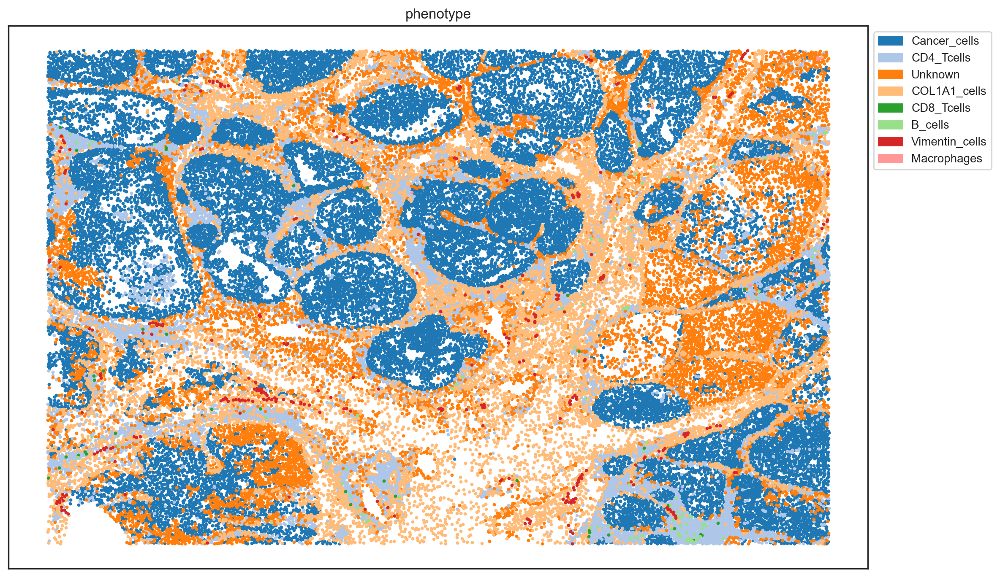

In [31]:
sm.pl.spatial_scatterPlot (subset_adata, colorBy = ['phenotype'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=8, fontsize=10)

In [33]:
subset_adata.obs.columns

Index(['CellID', 'Y_centroid', 'X_centroid', 'Area', 'MajorAxisLength',
       'MinorAxisLength', 'Eccentricity', 'Orientation', 'Extent', 'Solidity',
       'filter_by_ann', 'mean_DAPI_bg_abs_above_value',
       'mean_DAPI_bg_abs_below_value', 'Area_filter_nottoobig',
       'Area_filter_nottoolow', 'Area_filter', 'DAPI_ratio',
       'DAPI_ratio_pass_nottoolow', 'DAPI_ratio_pass_nottoohigh',
       'DAPI_ratio_pass', 'imageid', 'phenotype', 'spatial_lda_knn7_kmeans_k7',
       'spatial_lda_knn14_kmeans_k7', 'spatial_lda_knn21_kmeans_k7'],
      dtype='object')

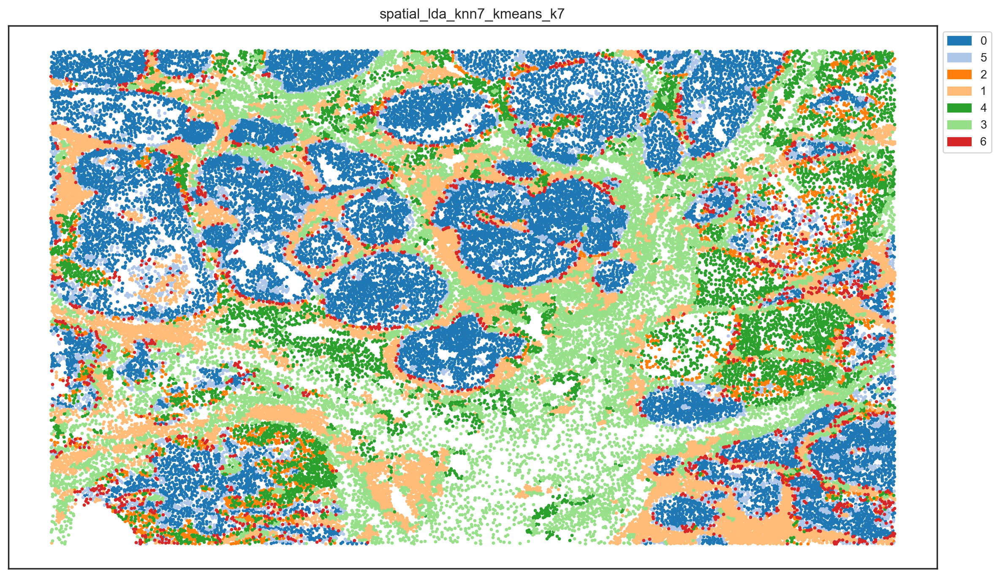

In [34]:
sm.pl.spatial_scatterPlot (subset_adata, colorBy = ['spatial_lda_knn7_kmeans_k7'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=8, fontsize=10)

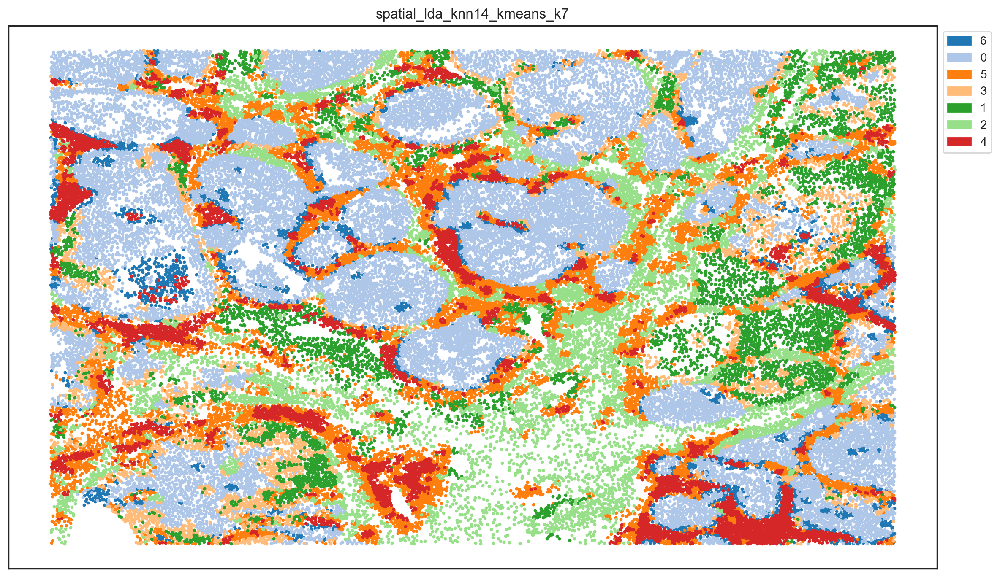

In [35]:
sm.pl.spatial_scatterPlot (subset_adata, colorBy = ['spatial_lda_knn14_kmeans_k7'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=8, fontsize=10)

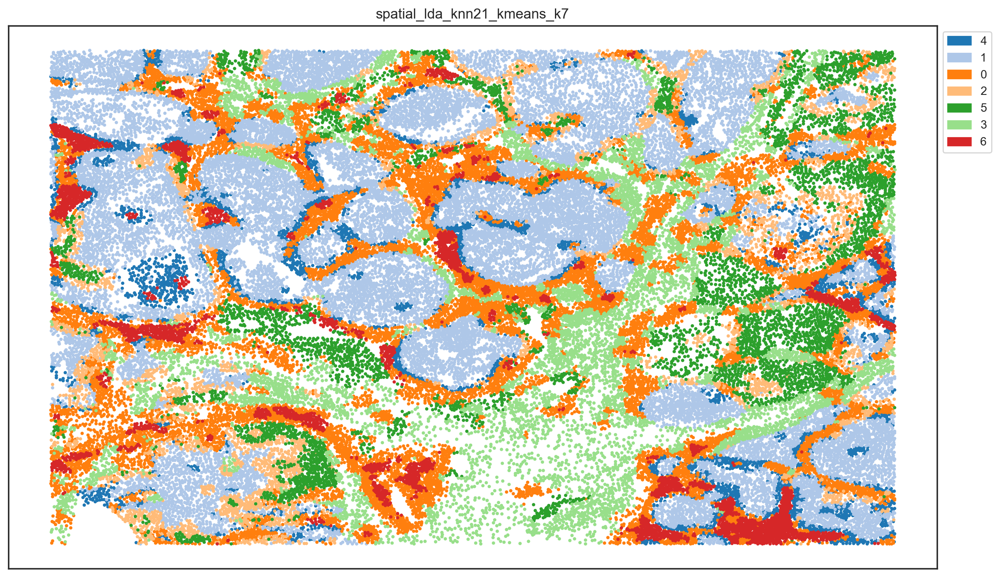

In [36]:
sm.pl.spatial_scatterPlot (subset_adata, colorBy = ['spatial_lda_knn21_kmeans_k7'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=8, fontsize=10)

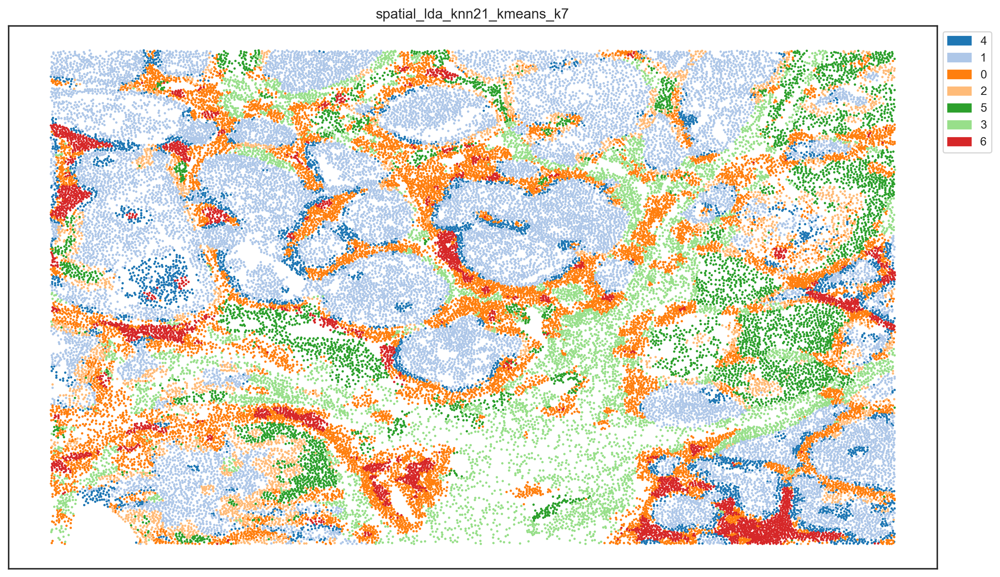

In [39]:
sm.pl.spatial_scatterPlot (subset_adata, colorBy = ['spatial_lda_knn21_kmeans_k7'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=4, fontsize=10)

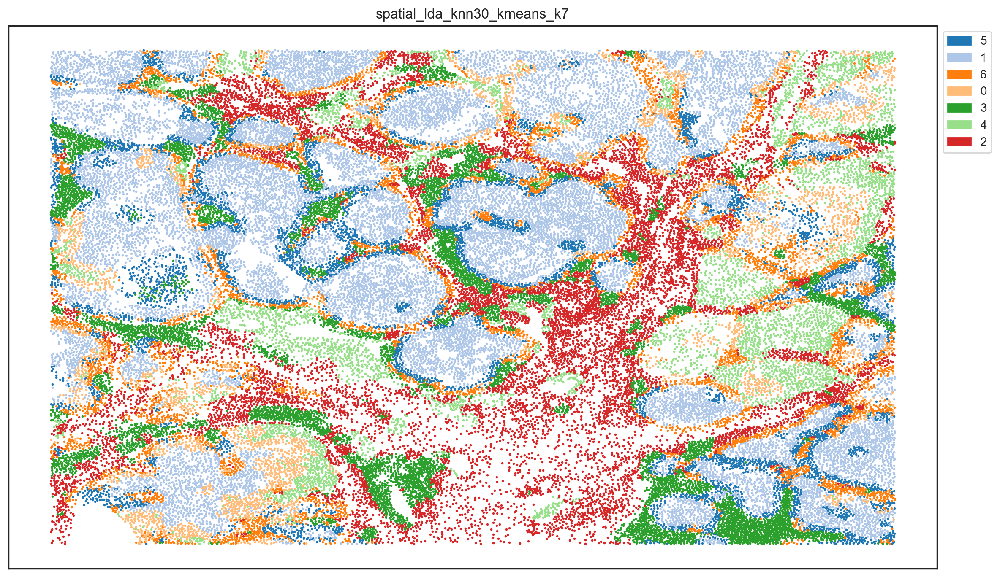

In [10]:
sm.pl.spatial_scatterPlot (subset_adata, colorBy = ['spatial_lda_knn30_kmeans_k7'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=4, fontsize=10)

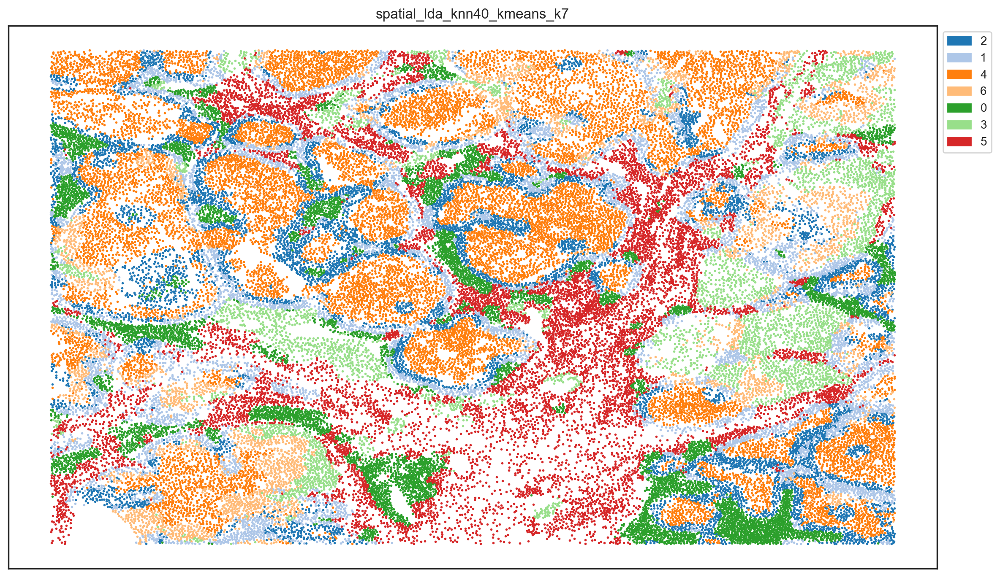

In [9]:
sm.pl.spatial_scatterPlot (subset_adata, colorBy = ['spatial_lda_knn40_kmeans_k7'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=4, fontsize=10)

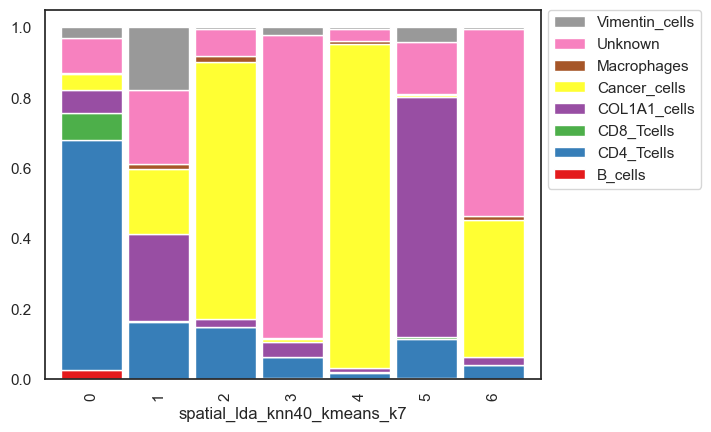

In [12]:
sm.pl.stacked_barplot (adata, x_axis='spatial_lda_knn40_kmeans_k7', y_axis='phenotype')

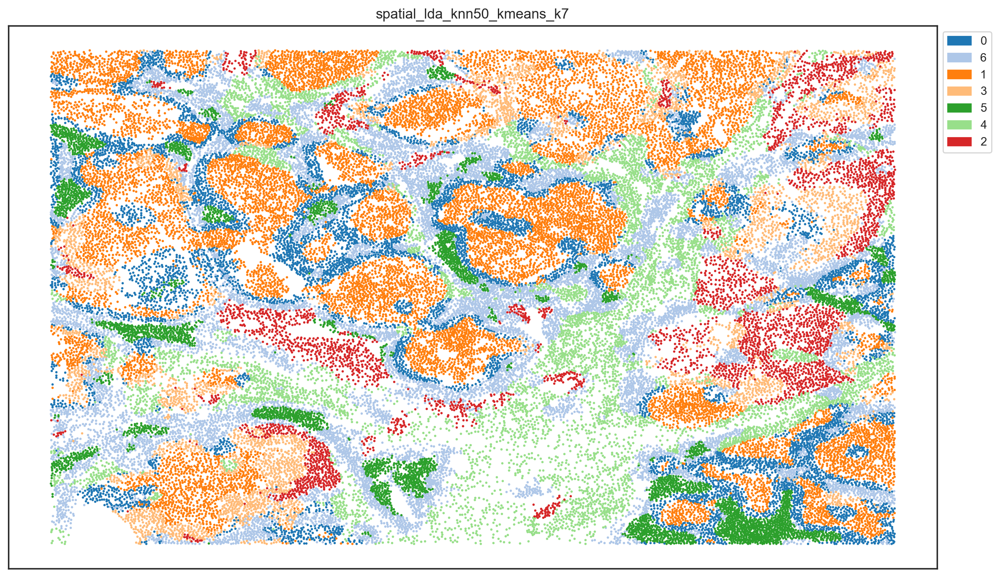

In [8]:
sm.pl.spatial_scatterPlot (subset_adata, colorBy = ['spatial_lda_knn50_kmeans_k7'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=4, fontsize=10)

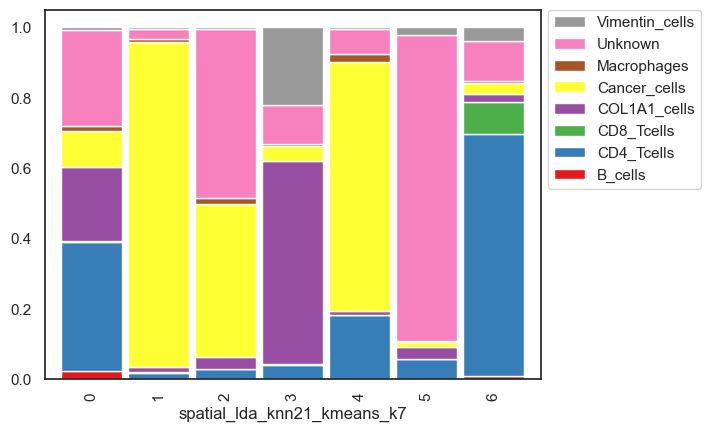

In [37]:
sm.pl.stacked_barplot (adata, x_axis='spatial_lda_knn21_kmeans_k7', y_axis='phenotype')

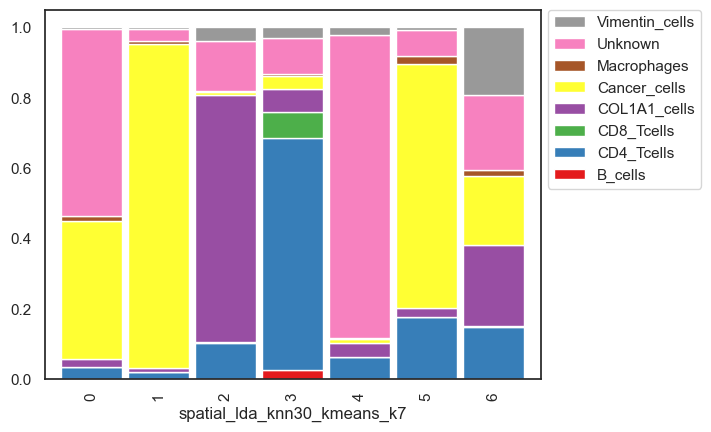

In [11]:
sm.pl.stacked_barplot (adata, x_axis='spatial_lda_knn30_kmeans_k7', y_axis='phenotype')

In [13]:
adata.write_h5ad(f'../data/processed/{time.strftime("%Y%m%d_%H%M")}_991_992_knn_RCN.h5ad')

# Export Knn21 k7 as geojson